In [14]:
import pandas as pd
import numpy as np
import plotly.express as px
import nltk
from sklearn.preprocessing import RobustScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold, StratifiedKFold, RandomizedSearchCV
from sklearn.linear_model import LinearRegression, SGDRegressor, BayesianRidge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn import neighbors
from xgboost import XGBRegressor
from sklearn.ensemble import ExtraTreesRegressor
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv1D, MaxPooling1D, Flatten, LSTM, SimpleRNN
from tensorflow.keras.layers import Bidirectional, GRU, UpSampling1D

#nltk.download('stopwords')

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [15]:
df_attacks = pd.read_csv("../data/globalterrorismdb_0718dist.csv", encoding="ISO-8859-1", low_memory=False)
df_attacks.head()
df_attacks = df_attacks[['eventid','iyear', 'imonth', 'iday', 'country_txt', 'region_txt', 
'provstate', 'city', 'latitude', 'longitude', 'suicide', 'attacktype1_txt', 'targtype1_txt', 
'gname', 'motive', 'weaptype1_txt', 'nkill']]
df_attacks.rename(columns={"eventid": "Event ID", "iyear": "Year", "imonth": "Month", 
"country_txt": "Country", "region_txt": "Region", "provstate": "Province/State", "city": "City", "latitude": "Latitude", 
"longitude": "Longitude", "suicide": "Suicide", "attacktype1_txt": "Attack Type",
"targtype1_txt": "Target Type", "gname": "Terrorist Group", "motive": "Motive", 
"weaptype1_txt": "Weapon Type", "nkill": "Casualties"}, inplace=True)

df_population = pd.read_csv("../data/population.csv")
df_population = df_population[["Country","Year", "Migrants(net)", "FertilityRate"]]
df_population.rename(columns= {"FertilityRate": "Fertility Rate", "Migrants(net)": "Migrants (net)"}, inplace=True)

df_gdp = pd.read_csv("../data/world_country_gdp_usd.csv")
df_gdp = df_gdp[['Country Name','year', 'GDP_USD', "GDP_per_capita_USD"]]
df_gdp.rename(columns= {"Country Name": "Country", "year": "Year", "GDP_USD":"GDP (in USD)", "GDP_per_capita_USD": "GDP (per capita)"}, inplace=True)

df_us_population = pd.read_csv("../data/us_population.csv")
df_us_population = df_us_population[["state", "pop2022"]]
df_us_population.rename(columns= {"state": "State", "pop2022": "Population"}, inplace=True) 

In [16]:
df_attacks.head()

,Event ID,Year,Month,iday,Country,Region,Province/State,City,Latitude,Longitude,Suicide,Attack Type,Target Type,Terrorist Group,Motive,Weapon Type,Casualties
0,197000000001,1970,7,2,Dominican Republic,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,0,Assassination,Private Citizens & Property,MANO-D,NaN,Unknown,1.0
1,197000000002,1970,0,0,Mexico,North America,Federal,Mexico city,19.371887,-99.086624,0,Hostage Taking (Kidnapping),Government (Diplomatic),23rd of September Communist League,NaN,Unknown,0.0
2,197001000001,1970,1,0,Philippines,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,0,Assassination,Journalists & Media,Unknown,NaN,Unknown,1.0
3,197001000002,1970,1,0,Greece,Western Europe,Attica,Athens,37.997490,23.762728,0,Bombing/Explosion,Government (Diplomatic),Unknown,NaN,Explosives,NaN
4,197001000003,1970,1,0,Japan,East Asia,Fukouka,Fukouka,33.580412,130.396361,0,Facility/Infrastructure Attack,Government (Diplomatic),Unknown,NaN,Incendiary,NaN


In [17]:
df_attacks.isnull().sum()

Event ID                0
Year                    0
Month                   0
iday                    0
Country                 0
Region                  0
Province/State        421
City                  434
Latitude             4556
Longitude            4557
Suicide                 0
Attack Type             0
Target Type             0
Terrorist Group         0
Motive             131130
Weapon Type             0
Casualties          10313
dtype: int64

In [18]:
df_population.head()

,Country,Year,Migrants (net),Fertility Rate
0,Afghanistan,1955,-4000,7.45
1,Afghanistan,1960,-4000,7.45
2,Afghanistan,1965,-4000,7.45
3,Afghanistan,1970,-4000,7.45
4,Afghanistan,1975,-4000,7.45


In [19]:
df_population.isnull().sum()

Country           0
Year              0
Migrants (net)    0
Fertility Rate    0
dtype: int64

In [20]:
df_gdp.head()

,Country,Year,GDP (in USD),GDP (per capita)
0,Aruba,1960,NaN,NaN
1,Africa Eastern and Southern,1960,2.129059e+10,162.726326
2,Afghanistan,1960,5.377778e+08,59.773234
3,Africa Western and Central,1960,1.040414e+10,107.930722
4,Angola,1960,NaN,NaN


In [21]:
len(df_gdp)

16492

In [22]:
df_gdp.isnull().sum()

Country                0
Year                   0
GDP (in USD)        3374
GDP (per capita)    3377
dtype: int64

In [23]:
fig = px.scatter_geo(df_attacks, lon="Longitude", lat="Latitude", animation_frame="Year", color="Region",
                     projection="equirectangular", animation_group="Year", title="Terrorist Attacks (1970 - 2017)")
fig.update_layout(title_x=0.44)
fig.update_layout(height=600, margin={"r":0,"t":60,"l":0,"b":0})
fig.show()

In [24]:
us_states = np.asarray(['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA',
                        'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA',
                        'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY',
                        'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
                        'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'])
us_state_to_abbrev = {
    "Alabama": "AL",
    "Alaska": "AK",
    "Arizona": "AZ",
    "Arkansas": "AR",
    "California": "CA",
    "Colorado": "CO",
    "Connecticut": "CT",
    "Delaware": "DE",
    "Florida": "FL",
    "Georgia": "GA",
    "Hawaii": "HI",
    "Idaho": "ID",
    "Illinois": "IL",
    "Indiana": "IN",
    "Iowa": "IA",
    "Kansas": "KS",
    "Kentucky": "KY",
    "Louisiana": "LA",
    "Maine": "ME",
    "Maryland": "MD",
    "Massachusetts": "MA",
    "Michigan": "MI",
    "Minnesota": "MN",
    "Mississippi": "MS",
    "Missouri": "MO",
    "Montana": "MT",
    "Nebraska": "NE",
    "Nevada": "NV",
    "New Hampshire": "NH",
    "New Jersey": "NJ",
    "New Mexico": "NM",
    "New York": "NY",
    "North Carolina": "NC",
    "North Dakota": "ND",
    "Ohio": "OH",
    "Oklahoma": "OK",
    "Oregon": "OR",
    "Pennsylvania": "PA",
    "Rhode Island": "RI",
    "South Carolina": "SC",
    "South Dakota": "SD",
    "Tennessee": "TN",
    "Texas": "TX",
    "Utah": "UT",
    "Vermont": "VT",
    "Virginia": "VA",
    "Washington": "WA",
    "West Virginia": "WV",
    "Wisconsin": "WI",
    "Wyoming": "WY",
    "District of Columbia": "DC",
    "American Samoa": "AS",
    "Guam": "GU",
    "Northern Mariana Islands": "MP",
    "Puerto Rico": "PR",
    "United States Minor Outlying Islands": "UM",
    "U.S. Virgin Islands": "VI",
}

In [25]:
df_attacks_us = df_attacks[df_attacks["Country"] == "United States"] 
df_attacks_us = pd.DataFrame(df_attacks_us.groupby("Province/State")["Event ID"].count())
df_attacks_us = df_attacks_us.reset_index()
df_attacks_us.rename(columns={"Province/State": "State", "Event ID": "Number of Terrorist Attacks"}, inplace=True)
df_attacks_us = df_attacks_us[df_attacks_us["State"] != "Unknown"]
df_attacks_us["State Code"] = df_attacks_us["State"].apply(lambda x: us_state_to_abbrev[x])

In [26]:
def scale_column(df, column, minVal=float('-inf'), maxVal=float('inf')):
    if minVal == float('-inf'):
        minVal = min(df[column])
    if maxVal == float('inf'):
        maxVal = max(df[column])
    res = []
    for val in df[column]:
        res.append((val - minVal) / (maxVal - minVal))
    return res

df_us_population.head()
df_attacks_us = df_attacks_us.merge(df_us_population[['State', 'Population']])
df_attacks_us["Number of Terrorist Attacks (Standardised)"] = df_attacks_us["Number of Terrorist Attacks"] / df_attacks_us["Population"]
tempVal = scale_column(df_attacks_us, "Number of Terrorist Attacks (Standardised)")
df_attacks_us["Number of Terrorist Attacks (Standardised)"] = tempVal
df_attacks_us = df_attacks_us.sort_values(by="Number of Terrorist Attacks (Standardised)", ascending=False)
df_attacks_us.head(100)

,State,Number of Terrorist Attacks,State Code,Population,Number of Terrorist Attacks (Standardised)
31,New York,515,NY,20365879,1.000000
36,Oregon,67,OR,4318492,0.599580
4,California,595,CA,39995077,0.573445
46,Washington,101,WA,7901429,0.487634
26,Nebraska,24,NE,1988536,0.458407
30,New Mexico,24,NM,2129190,0.425739
40,South Dakota,9,SD,901165,0.373096
12,Illinois,112,IL,12808884,0.322161
20,Massachusetts,57,MA,7126375,0.291616
44,Vermont,5,VT,646545,0.280756


In [27]:
fig = px.choropleth(df_attacks_us, locations='State Code', color='Number of Terrorist Attacks (Standardised)',
                    color_continuous_scale="Viridis",
                    locationmode="USA-states", 
                    scope="usa",
                    labels={'Number of Terrorist Attacks':'Number of Terrorist Attacks'},
                    title="Terrorist Attacks in the US (1970-2017)")
fig.update_layout(title_x=0.44)
fig.update_layout( legend = {"xanchor": "right", "x": -0, "y":1.9})
fig.show()

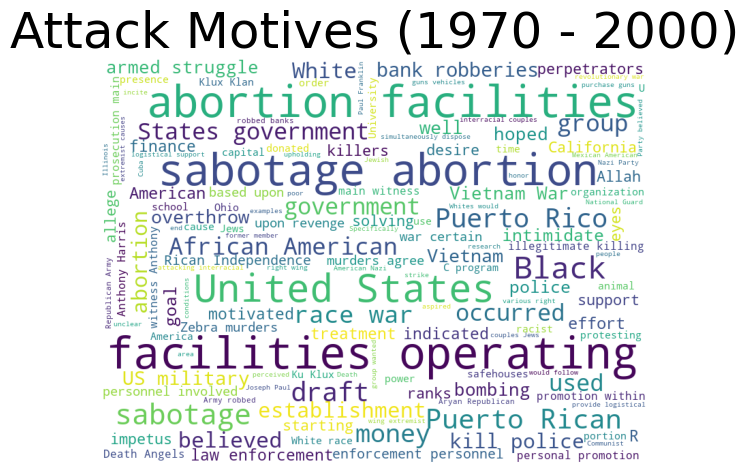

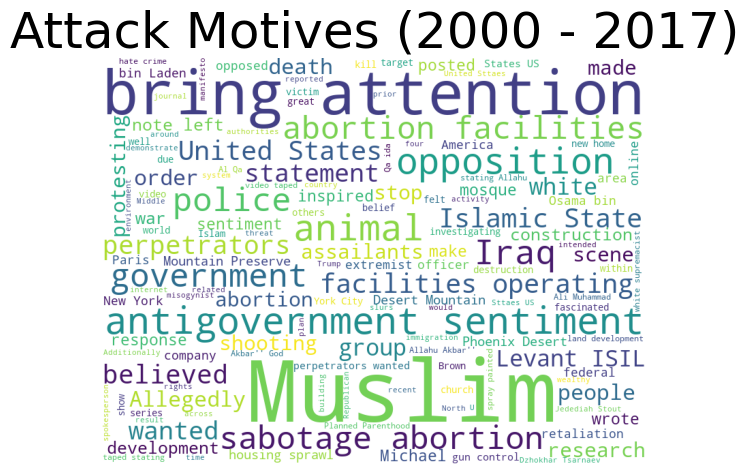

In [28]:
stpwrd = nltk.corpus.stopwords.words('english')
stpwrd.extend(["specific",  "motive", "unknown", "Unknown", "incident", "claimed", "responsibility", "however", "unaffiliated", "individual", "identified", "killed", "stated", "anti", "attacks", "protest", "carried", "attack", "trend", "larger", "may", "part", "following", "community", "sources", "violence", "targeting", "noted", "posited", "suspected", "targeting", "members", "noted", "targeted", "also", "assailant", "perpetrator", "meant", "bring attention", "practice", "perpetrator", "assailant", "meant"])

df_attacks_us = df_attacks[df_attacks["Country"] == "United States"]
df_attacks_us = df_attacks_us[["Year", "Motive"]]
df_attacks_us = df_attacks_us.dropna()

temp_df = df_attacks_us[(df_attacks_us["Year"] >= 1970) & (df_attacks_us["Year"] < (2000))]
motive = list(temp_df["Motive"].values)
motive = " ".join(motive)
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud(width=800, height=600,
                background_color ='white', 
                stopwords=stpwrd,
                min_font_size = 10).generate(motive)
plt.figure(figsize = (6, 6), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off")
plt.tight_layout(pad = 2)
plt.title("Attack Motives (" + str(1970) + " - " + str(2000) + ")", fontdict={'fontsize': 36})
plt.show()

stpwrd = nltk.corpus.stopwords.words('english')
stpwrd.extend(["specific",  "motive", "unknown", "Unknown", "incident", "claimed", "responsibility", "however", "unaffiliated", "individual", "identified", "killed", "stated", "anti", "attacks", "protest", "carried", "attack", "trend", "larger", "may", "part", "following", "community", "sources", "violence", "targeting", "noted", "posited", "suspected", "targeting", "members", "noted", "targeted", "also", "assailant", "perpetrator", "meant", "bring attention", "practice", "perpetrator", "assailant", "meant"])


df_attacks_us = df_attacks[df_attacks["Country"] == "United States"]
df_attacks_us = df_attacks_us[["Year", "Motive"]]
df_attacks_us = df_attacks_us.dropna()

temp_df = df_attacks_us[(df_attacks_us["Year"] >= 2000) & (df_attacks_us["Year"] <= (2017))]
motive = list(temp_df["Motive"].values)
motive = " ".join(motive)
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud(width=800, height=600,
                background_color ='white', 
                stopwords=stpwrd,
                min_font_size = 10).generate(motive)
plt.figure(figsize = (6, 6), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off")
plt.tight_layout(pad = 2)
plt.title("Attack Motives (" + str(2000) + " - " + str(2017) + ")", fontdict={'fontsize': 36})
plt.show()

In [29]:
yearly_freq = pd.DataFrame(df_attacks.groupby("Year")["Event ID"].count()).reset_index()
yearly_freq.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)
fig = px.bar(yearly_freq, x=yearly_freq["Year"], y=yearly_freq["Number of Terrorist Attacks"], height=400, title="Frequency of Terrorist Attacks (1970-2017)")
fig.update_layout(title_x=0.5)
fig.show()

In [30]:
region_freq = pd.DataFrame(df_attacks.groupby("Region")["Event ID"].count()).reset_index()
region_freq.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)
region_freq = region_freq.sort_values(by="Number of Terrorist Attacks", ascending=False)
fig = px.bar(region_freq, x=region_freq["Region"], y=region_freq["Number of Terrorist Attacks"], height=400, title="Region-wise Frequency of Terrorist Attacks (1970-2017)")
fig.update_layout(title_x=0.5)
fig.show()

In [31]:
region_freq = pd.DataFrame(df_attacks.groupby(["Region", "Attack Type"])["Event ID"].count()).reset_index()
region_freq.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)
region_freq = region_freq.sort_values(by="Number of Terrorist Attacks", ascending=False)
fig = px.bar(region_freq, x=region_freq["Region"], y=region_freq["Number of Terrorist Attacks"], color="Attack Type", height=400, title="Attack Types in Different Regions", barmode="relative")
fig.update_layout(title_x=0.5)
fig.show()


In [32]:
country_freq = pd.DataFrame(df_attacks.groupby("Country")["Event ID"].count()).reset_index()
country_freq.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)
country_freq = country_freq.sort_values(by="Number of Terrorist Attacks", ascending=False)[:10]
fig = px.bar(country_freq, x=country_freq["Country"], y=country_freq["Number of Terrorist Attacks"], height=400, title="Countries with Highest Number of Terrorist Attacks")
fig.update_layout(title_x=0.5)
fig.show()

In [33]:
casualty_freq = pd.DataFrame(df_attacks.groupby("Country")["Casualties"].sum()).reset_index()
casualty_freq = casualty_freq.sort_values(by="Casualties", ascending=False)[:10]
fig = px.bar(casualty_freq, x=casualty_freq["Country"], y=casualty_freq["Casualties"], height=400, title="Countries with Highest Number of Casualties")
fig.update_layout(title_x=0.5)
fig.show()

In [34]:
import bar_chart_race as bcr
df_countries_pivot = pd.DataFrame(df_attacks.groupby(["Country", "Year"]).count()).reset_index()
df_countries_pivot.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)
df_countries_pivot = df_countries_pivot.pivot_table(values = 'Number of Terrorist Attacks',index = ['Year'], columns = 'Country')
df_countries_pivot.fillna(0, inplace=True)
df_countries_pivot.sort_values(list(df_countries_pivot.columns),inplace=True)
df_countries_pivot = df_countries_pivot.sort_index()
df_countries_pivot.iloc[:, 0:-1] = df_countries_pivot.iloc[:, 0:-1].cumsum()
bcr.bar_chart_race(df = df_countries_pivot, 
                   n_bars = 10,
                   period_length=750,
                   sort='desc',
                   title="Countries with Highest Number of Terrorist Attacks",
                   filter_column_colors=True,
                   filename = None)

c:\Users\SJoshi\Anaconda3\lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 127 () missing from current font.

c:\Users\SJoshi\Anaconda3\lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 128 (\x80) missing from current font.

c:\Users\SJoshi\Anaconda3\lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 129 (\x81) missing from current font.

c:\Users\SJoshi\Anaconda3\lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 130 (\x82) missing from current font.

c:\Users\SJoshi\Anaconda3\lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 131 (\x83) missing from current font.

c:\Users\SJoshi\Anaconda3\lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 132 (\x84) missing from current font.

c:\Users\SJoshi\Anaconda3\lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning:

Glyph 133 (\x85) missing from current font.

c:\Users\SJoshi\Anaconda3\lib\site-pa

In [35]:
TOP_N = 5
target_freq = pd.DataFrame(df_attacks.groupby("Target Type")["Event ID"].count()).reset_index()
target_freq.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)
rem_freq = target_freq.sort_values(by="Number of Terrorist Attacks", ascending=False)[TOP_N:]
target_freq = target_freq.sort_values(by="Number of Terrorist Attacks", ascending=False)[:TOP_N]
others_row = {"Target Type": "Others", "Number of Terrorist Attacks": rem_freq["Number of Terrorist Attacks"].sum()}
target_freq = target_freq.append(others_row, ignore_index=True)
fig = px.pie(target_freq, values='Number of Terrorist Attacks', hole=.4, names='Target Type', height=400, title="Target Types")
fig.update_layout(title_x=0.445)
# fig.update_layout( legend = {"xanchor": "right", "x": 0.9, "y":0.9})
fig.show()

In [36]:
groupwise_casualty_freq = pd.DataFrame(df_attacks.groupby("Terrorist Group")["Casualties"].sum()).reset_index()
groupwise_casualty_freq = groupwise_casualty_freq.sort_values(by="Casualties", ascending=False)[:16]
fig = px.bar(groupwise_casualty_freq, x=groupwise_casualty_freq["Terrorist Group"], y=groupwise_casualty_freq["Casualties"], height=400)
fig.update_layout(title_x=0.5)
fig.show()

In [37]:
notorious_groups = list(groupwise_casualty_freq["Terrorist Group"])
df_notorious_groups = df_attacks[df_attacks["Terrorist Group"].isin(notorious_groups)]
df_notorious_groups = pd.DataFrame(df_notorious_groups.groupby(["Terrorist Group", "Year"])["Casualties"].sum().reset_index())
fig = px.line(df_notorious_groups, x="Year", y="Casualties", color="Terrorist Group", title='Attacks by different Terrorist Groups')
fig.update_layout(title_x=0.40)
fig.update_layout(height=600, margin={"r":0,"t":60,"l":0,"b":0})
fig.show()

In [38]:
import bar_chart_race as bcr
df_animation_pivot = df_notorious_groups.pivot_table(values = 'Casualties',index = ['Year'], columns = 'Terrorist Group')
df_animation_pivot.fillna(0, inplace=True)
df_animation_pivot.sort_values(list(df_animation_pivot.columns),inplace=True)
df_animation_pivot = df_animation_pivot.sort_index()
df_animation_pivot = df_animation_pivot.drop(columns=["Unknown"])
df_animation_pivot.iloc[:, 0:-1] = df_animation_pivot.iloc[:, 0:-1].cumsum()
bcr.bar_chart_race(df = df_animation_pivot, 
                   n_bars = 8, 
                   period_length=500,
                   sort='desc',
                #    period_fmt="For only {:.0f} dollars!",
                   title="Terrorist Groups with Highest Terrorist Attacks",
                   filename = None)

c:\Users\SJoshi\Anaconda3\lib\site-packages\bar_chart_race\_make_chart.py:286: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\SJoshi\Anaconda3\lib\site-packages\bar_chart_race\_make_chart.py:287: UserWarning:

FixedFormatter should only be used together with FixedLocator



In [39]:
df_countries_casualties = pd.DataFrame(df_attacks.groupby(["Country"])["Casualties"].sum().reset_index())
df_countries_terrorist_count = pd.DataFrame(df_attacks.groupby(["Country"])["Event ID"].count().reset_index())
df_countries_terrorist_count.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)
df_merged_casualties_count = df_countries_casualties.merge(df_countries_terrorist_count[["Country", "Number of Terrorist Attacks"]])

In [40]:
fig = px.scatter(df_merged_casualties_count, x="Number of Terrorist Attacks", y="Casualties", title="Country-specific Attacks and Casualties", hover_data=["Country"])
fig.update_layout(title_x=0.50)
fig.show()

In [41]:
df_iso_codes = px.data.gapminder()[["country", "iso_alpha"]]
df_iso_codes.rename(columns={"country": "Country", "iso_alpha": "Country Code"}, inplace=True)
df_iso_codes.drop_duplicates(inplace=True)
df_iso_codes = df_iso_codes.reset_index()
df_iso_codes.drop(["index"], axis=1, inplace=True)
df_countries_terrorist_count = df_countries_terrorist_count.merge(df_iso_codes[['Country', 'Country Code']])
fig = px.choropleth(df_countries_terrorist_count, locations="Country Code",
                    color="Number of Terrorist Attacks",
                    hover_name="Country",
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title="Terrorist Attacks (1970 - 2017)")
fig.update_layout(title_x=0.44)
fig.update_layout(height=600, margin={"r":0,"t":60,"l":0,"b":0})
fig.show()

In [42]:
top_five_countries = list(country_freq["Country"].values)[:5]
country_freq_year = pd.DataFrame(df_attacks.groupby(["Year", "Country"])["Event ID"].count().reset_index())
country_freq_year = country_freq_year[country_freq_year["Country"].isin(top_five_countries)]
country_freq_year.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)

In [43]:
top_five_countries

['Iraq', 'Pakistan', 'Afghanistan', 'India', 'Colombia']

In [54]:
import plotly.express as px

df_terrorist_gdp = df_gdp[(df_gdp["Country"].isin(top_five_countries)) & ((df_gdp["Year"] >= 1970) & (df_gdp["Year"] <= 2017))]
df_all_gdp = df_gdp[((df_gdp["Year"] >= 1970) & (df_gdp["Year"] <= 2017))]
df_all_gdp = df_all_gdp.dropna()
df_all_gdp = pd.DataFrame(df_all_gdp.groupby("Year").mean().reset_index())
df_all_gdp.rename(columns={"GDP (in USD)": "World"}, inplace=True)
colorList = list(px.colors.qualitative.T10)
if colorList[0] != "black":
    colorList.insert(0, "black")
for country in top_five_countries:
    temp_gdp = df_terrorist_gdp[df_terrorist_gdp["Country"] == country]
    df_all_gdp[country] = list(temp_gdp["GDP (in USD)"])
fig = px.line(df_all_gdp, x='Year', y=df_all_gdp.columns[1:], title="Terrorism's Effect in GDP (1970 - 2017)", color_discrete_sequence=colorList, labels={
                     "value": "GDP (in USD)",
                     "variable": ""
                 })
fig.update_layout(title_x=0.50)
fig.show()


# import plotly.express as px

# df_terrorist_gdp = df_gdp[(df_gdp["Country"].isin(top_five_countries)) & ((df_gdp["Year"] >= 1970) & (df_gdp["Year"] <= 2017))]
# df_terrorist_gdp = df_terrorist_gdp[["Country", "Year", "GDP (per capita)"]]
# df_all_gdp = df_gdp[((df_gdp["Year"] >= 1970) & (df_gdp["Year"] <= 2017))]
# df_all_gdp = df_all_gdp.dropna()
# df_all_gdp = pd.DataFrame(df_all_gdp.groupby("Year").mean().reset_index())
# df_all_gdp = df_all_gdp[["Year", "GDP (per capita)"]]
# df_all_gdp.rename(columns={"GDP (per capita)": "World"}, inplace=True)
# colorList = list(px.colors.qualitative.T10)
# if colorList[0] != "black":
#     colorList.insert(0, "black")
# for country in top_five_countries:
#     temp_gdp = df_terrorist_gdp[df_terrorist_gdp["Country"] == country]
#     df_all_gdp[country] = list(temp_gdp["GDP (per capita)"])
# fig = px.line(df_all_gdp, x='Year', y=df_all_gdp.columns[1:], title="Terrorism's Effect in GDP (1970 - 2017)", color_discrete_sequence=colorList, labels={
#                      "value": "GDP (per capita)",
#                      "variable": ""
#                  })
# fig.update_layout(title_x=0.50)
# fig.show()

In [346]:
df_all_population = df_population[(df_population["Year"] >= 1970) & (df_population["Year"] <= 2017)]
df_terrorist_population = df_population[(df_population["Country"].isin(top_five_countries)) & ((df_population["Year"] >= 1970) & (df_population["Year"] <= 2017))]
df_all_population = df_all_population.dropna()
df_all_population = df_all_population.drop(['Fertility Rate'], axis=1)
df_all_population = pd.DataFrame(df_all_population.groupby("Year").mean().reset_index())
df_all_population.rename(columns={"Migrants (net)": "World"}, inplace=True)
for country in top_five_countries:
    temp_population = df_terrorist_population[df_terrorist_population["Country"] == country]
    df_all_population[country] = list(temp_population["Migrants (net)"])
fig = px.line(df_all_population, x='Year', y=df_all_population.columns[1:], title="Terrorism's Effect in Migration (1970 - 2017)", labels={
                     "value": "Net number of Migrants",
                     "variable": ""
                 })
fig.update_layout(title_x=0.50)
fig.show()

In [347]:
df_all_fertility = df_population[(df_population["Year"] >= 1970) & (df_population["Year"] <= 2017)]
df_terrorist_fertility = df_population[(df_population["Country"].isin(top_five_countries)) & ((df_population["Year"] >= 1970) & (df_population["Year"] <= 2017))]
df_all_fertility = df_all_fertility.dropna()
df_all_fertility = df_all_fertility.drop(['Migrants (net)'], axis=1)
df_all_fertility = pd.DataFrame(df_all_fertility.groupby("Year").mean().reset_index())
df_all_fertility.rename(columns={"Fertility Rate": "World"}, inplace=True)
for country in top_five_countries:
    temp_fertility = df_terrorist_fertility[df_terrorist_fertility["Country"] == country]
    df_all_fertility[country] = list(temp_fertility["Fertility Rate"])
fig = px.line(df_all_fertility, x='Year', y=df_all_fertility.columns[1:], title="Terrorism's Effect in Fertility Rate (1970 - 2017)", color_discrete_sequence=colorList, labels={
                     "value": "Fertility Rate",
                     "variable": ""
                 })
fig.update_layout(title_x=0.50)
fig.show()

In [348]:
df_attacks.corr()

,Event ID,Year,Month,iday,Latitude,Longitude,Suicide,Casualties
Event ID,1.000000,0.999996,0.002706,0.018336,0.166886,0.003907,0.137743,0.015351
Year,0.999996,1.000000,0.000139,0.018254,0.166933,0.003917,0.137736,0.015341
Month,0.002706,0.000139,1.000000,0.005497,-0.015978,-0.003880,0.003071,0.003463
iday,0.018336,0.018254,0.005497,1.000000,0.003423,-0.002285,0.003593,-0.003693
Latitude,0.166886,0.166933,-0.015978,0.003423,1.000000,0.001463,0.068682,-0.018124
Longitude,0.003907,0.003917,-0.003880,-0.002285,0.001463,1.000000,0.000486,-0.000562
Suicide,0.137743,0.137736,0.003071,0.003593,0.068682,0.000486,1.000000,0.136086
Casualties,0.015351,0.015341,0.003463,-0.003693,-0.018124,-0.000562,0.136086,1.000000


In [350]:
import pandas as pd
from sklearn.model_selection import train_test_split
try:
    del df_attacks["Event ID"]
    del df_attacks["Motive"]
    del df_attacks["Latitude"]
    del df_attacks["Longitude"]
except:
    print("Some of the columns are not present")

In [351]:
df_attacks.isnull().sum()
df_attacks = df_attacks.dropna()
df_attacks.isnull().sum()


Year               0
Month              0
iday               0
Country            0
Region             0
Province/State     0
City               0
Suicide            0
Attack Type        0
Target Type        0
Terrorist Group    0
Weapon Type        0
Casualties         0
dtype: int64

In [384]:
from sklearn.preprocessing import LabelEncoder
df_attacks[['Country', 'Region', 'Province/State', 'City', 'Attack Type', 'Target Type', 'Terrorist Group', 'Weapon Type']] = df_attacks[['Country', 'Region', 'Province/State', 'City', 'Attack Type', 'Target Type', 'Terrorist Group', 'Weapon Type']].apply(LabelEncoder().fit_transform)

y = df_attacks["Casualties"]
X = df_attacks.drop(['Casualties'], axis=1)

In [385]:
# Split the data into train (70%), validation (15%), and test (15%) sets
X_trainval, X_test, y_trainval, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size=0.20, random_state=42)

scaler = RobustScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)
X_val = scaler.fit_transform(X_val)

# Print the shapes of the resulting sets
print("Training set shape:", X_train.shape, y_train.shape)
print("Validation set shape:", X_val.shape, y_val.shape)
print("Test set shape:", X_test.shape, y_test.shape)

Training set shape: (118870, 12) (118870,)
Validation set shape: (26094, 12) (26094,)
Test set shape: (25583, 12) (25583,)


In [392]:
def create_bilstm():
    model = Sequential()
    model.add(Bidirectional(LSTM(128, activation='relu', input_shape=(12,1), return_sequences=True)))
    model.add(Dropout(0.2))
    model.add(Bidirectional(LSTM(64, activation='relu')))
    model.add(Dropout(0.2))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1))
    return model

def create_ffnn():
    model = Sequential()
    model.add(Dense(128, activation='relu', input_shape=(12,)))
    model.add(Dropout(0.3))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(32, activation='sigmoid'))
    model.add(Dense(16, activation='tanh'))
    model.add(Dense(1))
    return model

def create_cnn():
    model = Sequential()
    model.add(Conv1D(32, 3, activation='relu', input_shape=(12,1)))
    model.add(MaxPooling1D(2))
    model.add(Conv1D(64, 3, activation='relu'))
    model.add(MaxPooling1D(2))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1))
    return model

def create_gru():
    model = Sequential()
    model.add(GRU(64, activation='tanh', input_shape=(12,1)))
    model.add(Dropout(0.2))
    model.add(Dense(32, activation='tanh'))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='linear'))
    return model

Epoch 1/10
929/929 [==============================] - 4s 4ms/step - loss: 107.7887 - val_loss: 282.0762
Epoch 2/10
929/929 [==============================] - 4s 4ms/step - loss: 106.1310 - val_loss: 282.5250
Epoch 3/10
929/929 [==============================] - 4s 4ms/step - loss: 105.8875 - val_loss: 280.7783
Epoch 4/10
929/929 [==============================] - 3s 4ms/step - loss: 105.4641 - val_loss: 280.6786
Epoch 5/10
929/929 [==============================] - 4s 5ms/step - loss: 105.2315 - val_loss: 280.6735
Epoch 6/10
929/929 [==============================] - 4s 5ms/step - loss: 105.0167 - val_loss: 279.7883
Epoch 7/10
929/929 [==============================] - 4s 4ms/step - loss: 104.7853 - val_loss: 279.9825
Epoch 8/10
929/929 [==============================] - 4s 5ms/step - loss: 104.5640 - val_loss: 279.1505
Epoch 9/10
929/929 [==============================] - 4s 4ms/step - loss: 104.2465 - val_loss: 279.4576
Epoch 10/10
800/800 [==============================] - 1s 1ms/st

In [399]:
import time

result = []

dlModels = {"Feed Forward NN": create_ffnn(), "CNN": create_cnn(), "GRU": create_gru(), "Bi-LSTM": create_bilstm()}

X_train_new = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val_new = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)
X_test_new = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

for name, model in dlModels.items():
    start_time = time.time()
    model.compile(optimizer='adam', loss='mse')
    if name == "Bi-LSTM":
        model.fit(X_train_new, y_train, epochs=20, batch_size=128, validation_data=(X_val_new, y_val))
        y_pred = model.predict(X_test_new)
    else:
        model.fit(X_train, y_train, epochs=20, batch_size=128, validation_data=(X_val, y_val))
        y_pred = model.predict(X_test)
    result.append([name, round(np.sqrt(mean_squared_error(y_test, y_pred)), 2), round(time.time() - start_time, 2)])


mlModels = {"Random Forest": RandomForestRegressor(), "K Neighbors": neighbors.KNeighborsRegressor(), "Decision Trees": DecisionTreeRegressor()}
for name, model in mlModels.items():
    start_time = time.time()
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    result.append([name, round(np.sqrt(mean_squared_error(y_test, pred)), 2), round(time.time() - start_time, 2)])

pd.options.display.float_format = '{:.2f}'.format
result_df = pd.DataFrame(result, columns=["Model", "Root Mean Squared Error", "Time (in seconds)"])
result_df.head(7)

Epoch 1/20
929/929 [==============================] - 5s 5ms/step - loss: 107.7016 - val_loss: 281.5768
Epoch 2/20
929/929 [==============================] - 3s 4ms/step - loss: 106.0566 - val_loss: 280.9854
Epoch 3/20
929/929 [==============================] - 4s 4ms/step - loss: 105.5568 - val_loss: 279.9323
Epoch 4/20
929/929 [==============================] - 4s 4ms/step - loss: 105.2939 - val_loss: 280.1222
Epoch 5/20
929/929 [==============================] - 4s 5ms/step - loss: 105.0906 - val_loss: 280.1726
Epoch 6/20
929/929 [==============================] - 5s 5ms/step - loss: 104.7407 - val_loss: 278.8955
Epoch 7/20
929/929 [==============================] - 4s 5ms/step - loss: 104.3961 - val_loss: 278.2964
Epoch 8/20
929/929 [==============================] - 4s 5ms/step - loss: 104.4202 - val_loss: 278.0031
Epoch 9/20
929/929 [==============================] - 5s 5ms/step - loss: 104.3518 - val_loss: 278.0454
Epoch 10/20
929/929 [==============================] - 5s 5ms/st

,Model,Root Mean Squared Error,Time (in seconds)
0,Feed Forward NN,8.68,81.79
1,CNN,8.77,88.31
2,GRU,8.77,241.59
3,Bi-LSTM,8.70,1662.26
4,Random Forest,9.00,66.46
5,K Neighbors,9.83,13.77


In [400]:
result_df

,Model,Root Mean Squared Error,Time (in seconds)
0,Feed Forward NN,8.68,81.79
1,CNN,8.77,88.31
2,GRU,8.77,241.59
3,Bi-LSTM,8.70,1662.26
4,Random Forest,9.00,66.46
5,K Neighbors,9.83,13.77
6,Decision Trees,12.82,0.99


['#5D3FD3', '#5D3FD3', '#5D3FD3', '#5D3FD3', '#0096FF', '#0096FF', '#0096FF']


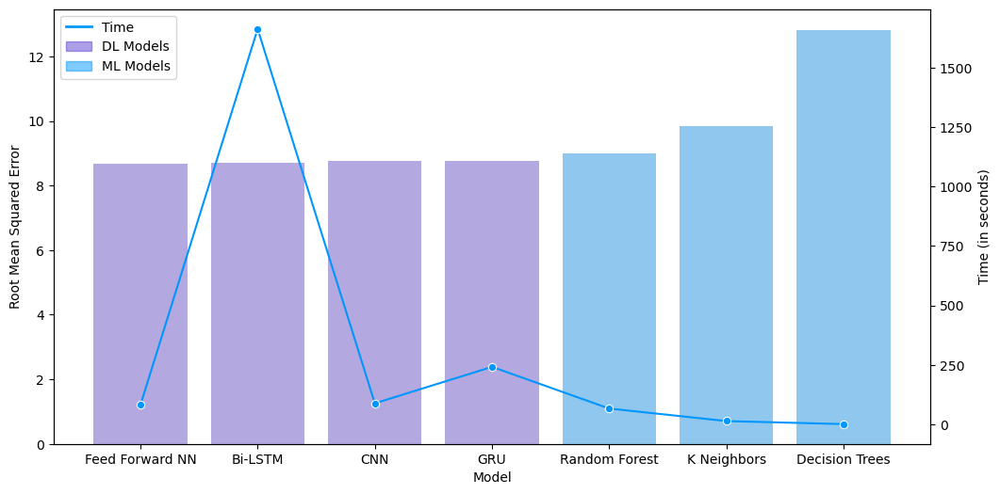

In [18]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches

result_df = result_df.sort_values(by=['Root Mean Squared Error'])
matplotlib.rc_file_defaults()
ax1 = sns.set_style(style=None, rc=None )

fig, ax1 = plt.subplots(figsize=(12,6))
colors = ["#5D3FD3", "#5D3FD3", "#5D3FD3","#5D3FD3", "#0096FF", "#0096FF", "#0096FF"]
sns.barplot(data = result_df, x='Model', y='Root Mean Squared Error', alpha=0.5, ax=ax1, palette=colors)
ax2 = ax1.twinx()
ax2.set_ylabel("Time (in seconds)")
dl = mpatches.Patch(color="#5D3FD3")
ml = mpatches.Patch(color="#0096FF")
custom_line = [Line2D([0], [0], color='#0096FF', lw=2), dl, ml]
leg = plt.legend(custom_line, ["Time", "DL Models", "ML Models"], loc="upper left")
for index, lh in enumerate(leg.legendHandles):
    if index > 0: 
        lh.set_alpha(0.5)
sns.lineplot(data = list(result_df["Time (in seconds)"]), marker='o', ax=ax2, color='#0096FF')
plt.show()

In [440]:
result_df.to_csv("./results.csv")  

In [4]:
result_df = pd.read_csv("./results.csv")